In [1]:
from Util import prepare_Task, TaskID_Generator
import os 
from Config import DataSetConfig, ModelConfig
import SegmentationTask 
import DataSet
import numpy as np

Classes = []
configs = []

Name = "Cardiomegaly"
Task = "Lung_Segmentation"
DataSetPath = "GeneratedData_20180316_095400_JSRT"



GPU_Num, BaseDataPath = prepare_Task(Task)

dataConfig = DataSetConfig(Name, (1024,1024,1), Classes, DataSetPath)
os.environ["CUDA_VISIBLE_DEVICES"] = GPU_Num
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
#configs.append(config)

train_data, train_files, train_labels, mean , std= DataSet.get_Data_Set_Segmentaion(dataConfig, BaseDataPath,"train")
valid_data, valid_files, valid_labels, mean , std= DataSet.get_Data_Set_Segmentaion(dataConfig, BaseDataPath,"validation")
test_data, test_files, test_labels, _, _ = DataSet.get_Data_Set_Segmentaion(dataConfig, BaseDataPath,"test")
test_data = np.asarray(test_data)
test_labels = np.asarray(test_labels)
valid_data = np.asarray(valid_data)
valid_labels = np.asarray(valid_labels)
train_data = np.asarray(train_data)
valid_labels = np.asarray(valid_labels)

train_data -= mean
train_data /= std
valid_data -= mean
valid_data /= std
test_data -= mean
test_data /= std


/home/gyungchan2110/gyungchan2110_python3/lib/python3.4/importlib/_bootstrap.py:321: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  return f(*args, **kwds)
Using TensorFlow backend.


/data/gyungchan2110/Lung_Segmentation/GeneratedData_20180316_095400_JSRT/Imgs/train
train 150
 : --- 24.04580593109131 seconds ---
/data/gyungchan2110/Lung_Segmentation/GeneratedData_20180316_095400_JSRT/Imgs/validation
validation 50
 : --- 7.843717813491821 seconds ---
/data/gyungchan2110/Lung_Segmentation/GeneratedData_20180316_095400_JSRT/Imgs/test
test 47
 : --- 7.728611946105957 seconds ---


In [2]:
# Train Code

ModelConfigs = []
config = ModelConfig(Name, "UNET2D", "ADAM",1, 1e-4)
config.LOSS = "binary_crossentropy"
config.WIDTH_SHIFT_RANGE = 0.05
config.HEIGHT_SHIFT_RANGE = 0.05
config.ZOOM_RANGE = 0.01
config.BATCH_SIZE = 4
ModelConfigs.append(config)

# config = ModelConfig(Name, "RESNET50", "ADAM",16, 1e-4)
# ModelConfigs.append(config)

for i in range(len(ModelConfigs)):
    GPU_Num, BaseDataPath = prepare_Task(Task)
    TaskID = TaskID_Generator() 
    os.environ["CUDA_VISIBLE_DEVICES"] = GPU_Num
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
    print(GPU_Num)
    result , model, filename = SegmentationTask.Train_DataSet(TaskID, BaseDataPath, dataConfig, ModelConfigs[i], train_data, valid_data, train_labels, valid_labels)
    if(result):
        SegmentationTask.Test_Dataset(TaskID, BaseDataPath, dataConfig, filename, test_data, test_labels)

3
Epoch 1/200
OOM when allocating tensor with shape[4,192,512,512]
	 [[Node: conv2d_18/convolution = Conv2D[T=DT_FLOAT, data_format="NHWC", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/gpu:0"](concatenate_3/concat, conv2d_18/kernel/read)]]
	 [[Node: loss/mul/_407 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/cpu:0", send_device="/job:localhost/replica:0/task:0/gpu:0", send_device_incarnation=1, tensor_name="edge_3105_loss/mul", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/cpu:0"]()]]

Caused by op 'conv2d_18/convolution', defined at:
  File "/usr/lib/python3.4/runpy.py", line 170, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.4/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/gyungchan2110/gyungchan2110_python3/lib/python3.4/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/g

ValueError: need more than 2 values to unpack

/data/gyungchan2110/Lung_Segmentation/[]_1_BasicData/Imgs/3.MS
3.MS 84
 : --- 7.452604055404663 seconds ---
0 3385016600000000_2140_1760.png
1 3292969600000000_2140_1760.png
2 3674495000000000_2017_1825.png
3 2639230700000000_2140_1760.png
4 3190461800000000_2140_1760.png
5 3306591300000000_2140_1760.png
6 4900711400000000_2017_1854.png
7 3564285900000000_2013_1843.png
8 4965652300000000_2017_1856.png
9 3158517000000000_2140_1760.png
10 1574076600000000_2140_1760.png
11 3166624000000000_2140_1760.png
12 3489140100000000_2688_2216.png
13 4671661100000000_2017_2014.png
14 3278464600000000_2140_1760.png
15 4866377500000000_2017_1858.png
16 4920733200000000_2017_1795.png
17 4839303800000000_2017_1850.png
18 3613485600000000_2140_1760.png
19 3321141300000000_2140_2140.png


/home/gyungchan2110/gyungchan2110_python3/lib/python3.4/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


20 4810093300000000_2017_1862.png
21 3249202400000000_2017_2009.png
22 3220738900000000_2140_1760.png
23 3428980600000000_2140_1760.png
24 4832243000000000_2017_1856.png
25 4814309300000000_2017_1832.png
26 3346912800000000_2140_1760.png
27 3615523300000000_2140_1760.png
28 3286255300000000_2140_1760.png
29 4744173200000000_2017_2017.png
30 4751032800000000_2017_2004.png
31 3384302900000000_2140_1760.png
32 3512903900000000_2140_1760.png
33 3630302500000000_2017_1832.png
34 3357760100000000_2140_1760.png
35 3433439500000000_2017_2017.png
36 3440394300000000_2140_1760.png
37 3195769800000000_1760_1760.png
38 3514648300000000_2140_1760.png
39 4887912100000000_2017_2014.png
40 4903400800000000_2017_1852.png
41 3632800000000000_2017_1799.png
42 3557552400000000_2140_2140.png
43 3383493100000000_2140_1760.png
44 3329085800000000_2140_1760.png
45 3620801200000000_2140_1760.png
46 3315152800000000_2140_1760.png
47 3315728500000000_2140_1760.png
48 3274256500000000_2140_1760.png
49 35388713000

/home/gyungchan2110/gyungchan2110_python3/Integrated_CNN_Project/DataSet.py:175: RuntimeWarning: Mean of empty slice.
  mean = Imgs.mean()
/home/gyungchan2110/gyungchan2110_python3/lib/python3.4/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/gyungchan2110/gyungchan2110_python3/lib/python3.4/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/gyungchan2110/gyungchan2110_python3/lib/python3.4/site-packages/numpy/core/_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/gyungchan2110/gyungchan2110_python3/lib/python3.4/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


4.MR 335
 : --- 35.002625703811646 seconds ---
0 2441536700000000_2017_1794.png
1 3249827900000000_2021_1896.png
2 3370518900000000_2140_1760.png
3 1960152200000000_2140_1760.png
4 2194808400000000_2140_1760.png
5 2520747500000000_1760_1760.png
6 2595734500000000_2140_1760.png
7 2458276200000000_2140_1760.png
8 4677996000000000_2017_2004.png
9 2590477600000000_2140_1760.png
10 3442663600000000_2140_1760.png
11 3459619300000000_2140_1760.png
12 3239672200000000_2140_1760.png
13 2428848800000000_1760_1760.png
14 1951720900000000_2017_1822.png
15 4958102300000000_2017_1817.png
16 3275125900000000_2017_2009.png
17 1365624500000000_2140_1760.png
18 1992958500000000_2140_2140.png
19 3349023000000000_2140_1760.png
20 4808838100000000_2017_2017.png
21 4725098100000000_2017_2009.png
22 2108780200000000_2017_1858.png
23 3504784100000000_2017_2017.png
24 4889866500000000_2017_2009.png
25 4707732600000000_2140_1760.png
26 3613069000000000_2017_1839.png
27 4711754100000000_2017_2017.png
28 32422537

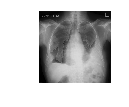

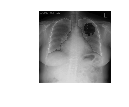

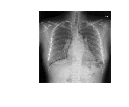

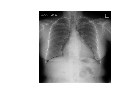

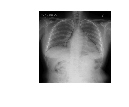

...

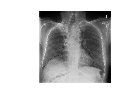

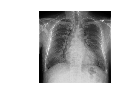

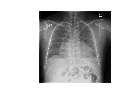

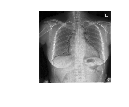

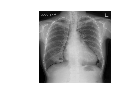

In [4]:
# Test Code

import SegmentationTask 
from Util import prepare_Task, TaskID_Generator
import os 
from Config import DataSetConfig, ModelConfig
import SegmentationTask 
import DataSet
import numpy as np

Classes = []
configs = []

Name = "Cardiomegaly"
Task = "Lung_Segmentation"
DataSetPath = "[]_1_BasicData"



GPU_Num, BaseDataPath = prepare_Task(Task)

dataConfig = DataSetConfig(Name, (1024,1024,1), Classes, DataSetPath)
os.environ["CUDA_VISIBLE_DEVICES"] = GPU_Num
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
#ModelFileName = "UNet_20180319_151912.hdf5"
ModelFileName = "UNet_20180319_095815.hdf5"



path = BaseDataPath + "/" + DataSetPath + "/Imgs" 

for folder in os.listdir(path):
    TaskID = TaskID_Generator() 
    test_data, test_files, test_labels, mean,std = DataSet.get_Data_Set_Segmentaion(dataConfig, BaseDataPath,folder)
    
    if(len(test_files) == 0):
        continue 
    test_data -= mean
    test_data /= std
    
    SegmentationTask.Test_Dataset(TaskID, BaseDataPath, dataConfig, ModelFileName, test_data, test_labels, test_files)